In [94]:
from __future__ import division

from pylab import *

import imnet_utils as imut
import sklearn
from sklearn.decomposition import PCA, FastICA, TruncatedSVD, SparseCoder
import time

%matplotlib inline


plt.rcParams.update({'axes.titlesize': 'xx-large'})
plt.rcParams.update({'axes.labelsize': 'xx-large'})
plt.rcParams.update({'xtick.labelsize': 'x-large', 'ytick.labelsize': 'x-large'})
plt.rcParams.update({'legend.fontsize': 'x-large'})
plt.rcParams.update({'text.usetex': True})

In [2]:
def norm_range(v):
    return (v-v.min())/(v.max()-v.min())

# Storing image sequence in the hypervector

A further generalization of the capacity analysis is to consider storing images in a hypervector. To store images, we utilize a clean-up memory, which is a set of basis vectors that serve to represent the image. This is the same as the alphabet, and we will have $D$ tokens to serve to represent the images.

First, I will load a ton of random image patches from an ImageNet database and create the basis vectors. I am going to use both pca (which will give me a "dense" representation of the image), and then I am going to perform ICA on the pca-reduced data, and get another set of basis vectors (these are a "sparse" representation of the image).


In [3]:
reload(imut)
patch_size=(20,20)
tstart = time.time()
impatches = imut.load_random_imnet_patches(100000, patch_size=patch_size)
print "Duration: ", time.time() - tstart


0 1000 2000 3000 4000 5000 6000 7000 8000 9000 10000 11000 12000 13000 14000 15000 16000 17000 18000 19000 20000 21000 22000 23000 24000 25000 26000 27000 28000 29000 30000 31000 32000 33000 34000 35000 36000 37000 38000 39000 40000 41000 42000 43000 44000 45000 46000 47000 48000 49000 50000 51000 52000 53000 54000 55000 56000 57000 58000 59000 60000 61000 62000 63000 64000 65000 66000 67000 68000 69000 70000 71000 72000 73000 74000 75000 76000 77000 78000 79000 80000 81000 82000 83000 84000 85000 86000 87000 88000 89000 90000 91000 92000 93000 94000 95000 96000 97000 98000 99000 Duration:  64.1653158665


In [4]:
import glob

im_list = glob.glob('data/image_net/*')
print len(im_list)

12226


/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


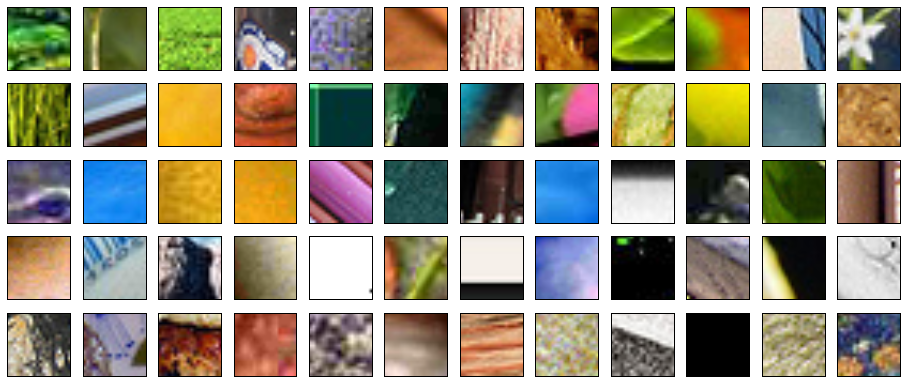

In [5]:

figure(figsize=(16,8))
nshow = 60
maxrow=12
for i in range(nshow):
    ax=subplot(nshow//maxrow + 1, maxrow,i+1)
    imshow(norm_range(impatches[:,:,:,i]))
    ax.set_xticks([])
    ax.set_yticks([])

** Figure 1: Sample image patches from the database. **

So, we are first going to turn all of our images into a matrix, just a sanity check to make shure the reshaping is done correctly.

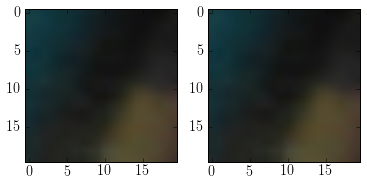

In [6]:
impatchr = impatches.copy().reshape((-1, impatches.shape[3]))

impatchr -= 1
impatchr /= 255

im_idx=18

irec = impatchr[:, im_idx].reshape((impatches.shape[0], impatches.shape[1], impatches.shape[2]))

subplot(121)
imshow((impatches[:,:,:,im_idx]-1)/255)
subplot(122)
imshow(irec)

In [7]:
mean01 = impatchr.mean()

In [8]:
impatchr -= impatchr.mean()

In [9]:
impatchr.shape

(1200, 100000)

Next, we do PCA-ICA anlaysis (this is actually the same as what I do with calcium imaging and vsd imaging) to get the basis vectors. We will use a set of `ncomponents=400` basis vectors. 

In [10]:

ncomponents = 1000

pca_encoder = TruncatedSVD(ncomponents)
fica_encoder = FastICA(ncomponents)



In [11]:
tstart = time.time()
pca_encoder.fit(impatchr.T)
print 'Duration: ', time.time() - tstart


Duration:  102.501418114


In [12]:
scores = pca_encoder.transform(impatchr.T)

In [13]:
scores.shape

(100000, 1000)

scores is the image data in the pca basis space -- i.e. there are 10,000 images and 400 pc basis vectors. Lets look at the basis vectors.

In [14]:
pc_comp = pca_encoder.components_

print pc_comp.shape

pc_comp_ims = pc_comp.T.reshape((impatches.shape[0], impatches.shape[1], impatches.shape[2], -1))

(1000, 1200)


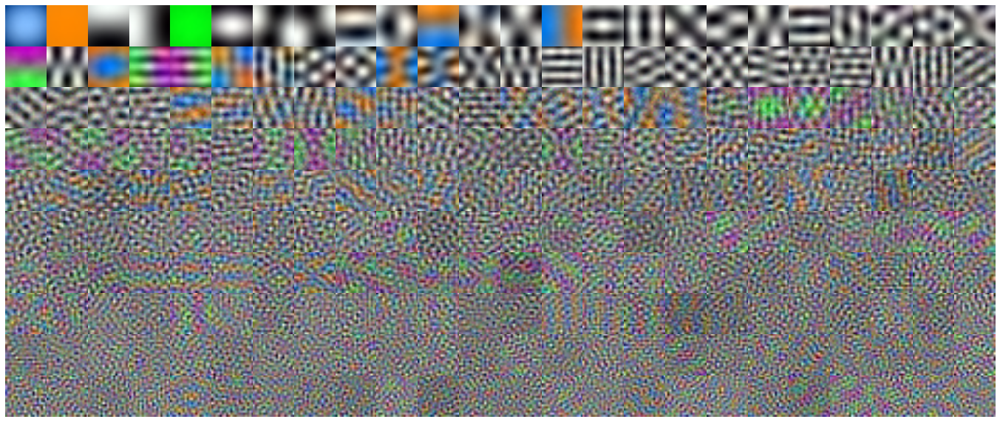

In [15]:
plt.rcParams['figure.subplot.hspace'] = 0
plt.rcParams['figure.subplot.wspace'] = 0

figure(figsize=(24,10))
nshow = 240
maxrow = 24
for i in range(nshow):
    ax=subplot(nshow//maxrow,maxrow,i+1)
    imshow(norm_range(pc_comp_ims[:,:,:,i+0]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)


** Figure 2: Basis images of top PCA components**

So, to get a sparse basis, we perform ICA on the image data (we used the dimensionality-reduced image data). This will actually give us just a linear projection of the same set of basis vectors that the PCA analysis provides. This means that the reconstruction of the image from either the PCA or ICA basis vectors should be exactly the same. 

In [16]:
tstart = time.time()
which_pcs = np.arange(400)
fica_encoder.fit(scores[:,which_pcs])
print 'Duration: ', time.time() - tstart


n_components is too large: it will be set to 400
Duration:  430.590018034


In [17]:
ic_scores = fica_encoder.transform(scores[:1000,which_pcs])

In [18]:
pc_scores = scores[:ic_scores.shape[0], :ic_scores.shape[1]]


In [19]:
ic_scores.shape

(1000, 400)

In [20]:
ic_comp = fica_encoder.components_
ic_comp /= ic_comp.std(axis=0)
ic_comp = np.dot(ic_comp, pc_comp[which_pcs,:])
print ic_comp.shape

(400, 1200)


Here is what some of the ICA basis vectors look like. We get a bunch of cool Gabor filters and color opponency edges.

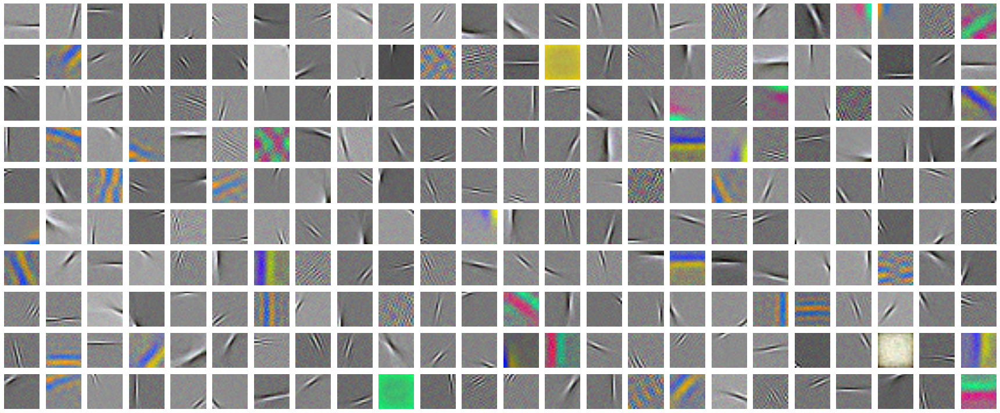

In [21]:
plt.rcParams['figure.subplot.hspace'] = 0
plt.rcParams['figure.subplot.wspace'] = 0


ic_comp_ims = ic_comp.T.reshape((impatches.shape[0], impatches.shape[1], impatches.shape[2], -1))
figure(figsize=(24,10))
nshow = 240
maxrow = 24
for i in range(nshow):
    ax=subplot(nshow//maxrow,maxrow,i+1)
    imshow(norm_range(ic_comp_ims[:,:,:,i+0]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)
    
plt.tight_layout()

** Figure 3: Sample of ICA basis vectors **

We can use these basis vectors to then represent an image. We just get a new random patch from the data base and use a linear regression (there are probably slightly better things than this, but not the point) of the image with the basis vectors to get a histogram of coefficients for each vector and that is the `pc_code` or `ic_code` that represents the image. Here is an image encoded into the basis and reconstructed, as well as the histogram of the coefficients (note we take out the mean of the image, which occasionally makes things look different because of renormalization).

In [22]:
nrecon = 16
impatch = imut.load_random_imnet_patches(nrecon, patch_size)
#impatch = impatches[:,:,:,58]
impatchr = impatch.reshape((-1, nrecon)).copy()
#impatchr -= impatchr.mean(axis=1)[:, np.newaxis]
impatchr = (impatchr-1)/255
impatchr -= mean01


ic_c = linalg.lstsq(ic_comp.T, impatchr)
pc_c = linalg.lstsq(pc_comp[which_pcs,:].T, impatchr)
ic_code = ic_c[0].T
pc_code = pc_c[0].T

0


In [23]:
impatchr.shape

(1200, 16)

In [24]:
ic_comp.shape

(400, 1200)

In [25]:
from sklearn.decomposition import SparseCoder

spcoder = SparseCoder(ic_comp, 'lasso_cd', transform_alpha=3)

sp_code = spcoder.transform(impatchr.T)

/home/epaxon/anaconda2/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:622: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self.precompute == 'auto':
/home/epaxon/anaconda2/lib/python2.7/site-packages/sklearn/linear_model/base.py:424: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if precompute == 'auto':
/home/epaxon/anaconda2/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:444: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations
  ConvergenceWarning)


In [26]:
sp_code.shape

(16, 400)

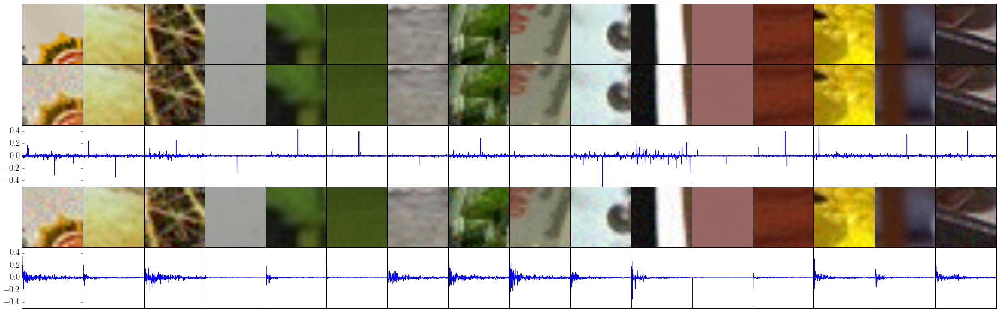

In [27]:


figure(figsize=(32, 10))

for imx in range(nrecon):
    
    ax = subplot(5, nrecon, imx + 1)
    imp = impatchr[:,imx].reshape(patch_size[0], patch_size[1], 3)
    imshow(imp+mean01)
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(5, nrecon, imx + 1 + nrecon)
    ic_recon = np.dot(ic_code[imx,:], ic_comp)
    ic_reconr = ic_recon.reshape(patch_size[0], patch_size[1], 3)
    
    ic_reconr = (ic_reconr + mean01)
    ic_reconr[ic_reconr<0] = 0 
    ic_reconr[ic_reconr>1] = 1
            
    
    imshow(ic_reconr)
    ax.set_xticks([])
    ax.set_yticks([])
    
    
    ax = subplot(5, nrecon, imx + 1 + 2*nrecon)
    plot(ic_code[imx,:].T)
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])

    ax = subplot(5, nrecon, imx + 1 + 3*nrecon)
    pc_recon = np.dot(pc_code[imx,:], pc_comp[which_pcs,:])
    pc_reconr = pc_recon.reshape(patch_size[0], patch_size[1], 3)
    
    pc_reconr += mean01
    pc_reconr[pc_reconr<0] = 0
    pc_reconr[pc_reconr>1] = 1
    
    imshow(pc_reconr)
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(5, nrecon, imx + 1 + 4*nrecon)
    plot(pc_code[imx,:].T/norm(pc_code[imx, :]))
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])


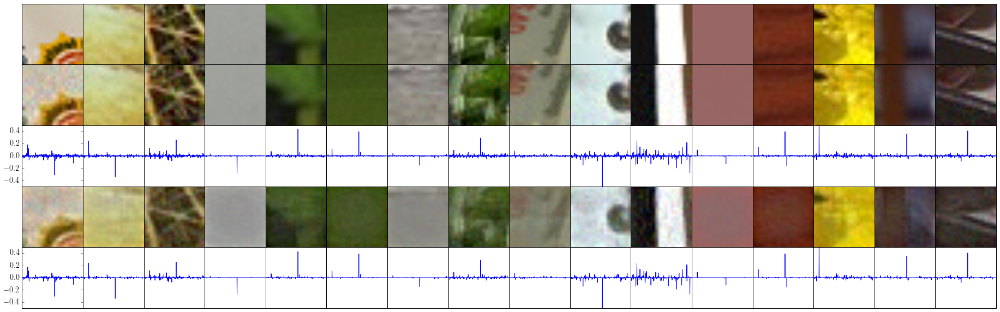

In [28]:


figure(figsize=(32, 10))

for imx in range(nrecon):
    
    ax = subplot(5, nrecon, imx + 1)
    imp = impatchr[:,imx].reshape(patch_size[0], patch_size[1], 3)
    imshow(imp+mean01)
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(5, nrecon, imx + 1 + nrecon)
    ic_recon = np.dot(ic_code[imx,:], ic_comp)
    ic_reconr = ic_recon.reshape(patch_size[0], patch_size[1], 3)
    
    ic_reconr = (ic_reconr + mean01)
    ic_reconr[ic_reconr<0] = 0 
    ic_reconr[ic_reconr>1] = 1
            
    
    imshow(ic_reconr)
    ax.set_xticks([])
    ax.set_yticks([])
    
    
    ax = subplot(5, nrecon, imx + 1 + 2*nrecon)
    plot(ic_code[imx,:].T)
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])

    ax = subplot(5, nrecon, imx + 1 + 3*nrecon)
    
    sp_recon = np.dot(sp_code[imx, :], ic_comp)
    sp_reconr = sp_recon.reshape(patch_size[0], patch_size[1], 3)
    
    sp_reconr += mean01
    sp_reconr[sp_reconr<0] = 0
    sp_reconr[sp_reconr>1] = 1
    
    imshow(sp_reconr)
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(5, nrecon, imx + 1 + 4*nrecon)
    plot(sp_code[imx,:].T)
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])


** Figure 4: PCA and ICA vector encoding of new image patches. ** Top row: original image. Second row: ICA basis reconstruction of the image. Third row: histogram of ICA basis coefficients. Fourth row: PCA basis reconstruction of image. Bottom row: histogram of PCA basis coefficients.



In [26]:
np.allclose(ic_recon, pc_recon)

False

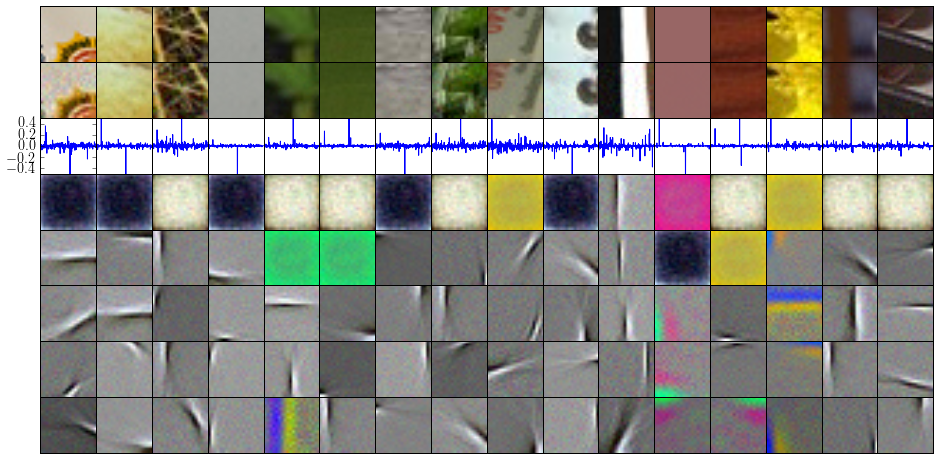

In [29]:
figure(figsize=(16, 8))

ic_ex = 2*arange(5)+1
nrows = 3 + len(ic_ex)
for imx in range(nrecon):
    
    ax = subplot(nrows, nrecon, imx + 1)
    imp = impatchr[:,imx].reshape(patch_size[0], patch_size[1], 3)
    imshow(imp+mean01)
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(nrows, nrecon, imx + 1 + nrecon)
    ic_recon = np.dot(ic_code[imx,:], ic_comp)
    ic_reconr = ic_recon.reshape(patch_size[0], patch_size[1], 3)
    
    ic_recon = np.dot(ic_code[imx,:], ic_comp)
    ic_reconr = ic_recon.reshape(patch_size[0], patch_size[1], 3)
    
    ic_reconr = (ic_reconr + mean01)
    ic_reconr[ic_reconr<0] = 0 
    ic_reconr[ic_reconr>1] = 1
            
    
    imshow(ic_reconr)
    ax.set_xticks([])
    ax.set_yticks([])
    
    
    ax = subplot(nrows, nrecon, imx + 1 + 2*nrecon)
    plot(ic_code[imx,:].T/norm(ic_code[imx, :]))
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])

          
    idx_max = np.argsort(abs(ic_code[imx,:]))
  
    for ici,icx in enumerate(ic_ex):
        ax = subplot(nrows, nrecon, imx + 1 + (3+ici)*nrecon)
        ic_compr = ic_comp[idx_max[-icx],:].reshape(patch_size[0], patch_size[1], 3) 
        ic_compr = ic_compr * ic_code[imx, idx_max[-icx]] # this just flips it if its negative
        imshow(norm_range(ic_compr))
        ax.set_xticks([])
        ax.set_yticks([])
    


** Figure 5: Maximum ICA component visualization. ** Top three rows: same as Figure 4. Bottom rows: The component with the top coefficients that encodes the image and is displayed.

Pretty surprisingly, 7/10 of the images have the same largest ICA component (some are dark blueish some bright yellowish, because of negative sign). This seems to be one of the primary color/light-dark opponenecy components. 

Next, we encode the basis histograms into the hypervector, and we will encode a sequence of images using trajectory-association. 

In [34]:
def test_hyperimage_capacity_pix(test_ims, N):

    K = 1
    ic_hyperpatch = 2*(np.random.randn(len(which_pcs), int(N)) < 0) - 1
    

    Mmax = test_ims.shape[3]

    test_imr = test_ims.reshape((-1, Mmax))
    #test_imr = test_imr - test_imr.mean(axis=1)[:, np.newaxis]
    test_imr = (test_imr-1)/255
    test_imr -= mean01
    
    
    pix_hyperpatch = 2*(np.random.randn(test_imr.shape[0], int(N)) < 0) - 1
    
    
    ic_c = linalg.lstsq(ic_comp.T, test_imr)

    ic_code = ic_c[0].T
    pix_code = test_imr.T.copy()

    ic_hyperimage = np.zeros(N)
    pix_hyperimage = np.zeros(N)

    ic_decode = np.zeros_like(ic_code)
    pix_decode = np.zeros_like(pix_code)

    ic_decode1 = np.zeros_like(ic_code)
    pix_decode1 = np.zeros_like(pix_code)

    for imx in range(Mmax):
        ic_hypercode = np.dot(ic_code[imx, :], ic_hyperpatch)
        pix_hypercode = np.dot(pix_code[imx, :], pix_hyperpatch)

        ic_hyperimage = np.roll(ic_hyperimage, 1) + ic_hypercode
        pix_hyperimage = np.roll(pix_hyperimage, 1) + pix_hypercode

        ic_decode[imx, :] = np.dot(ic_hyperpatch, np.roll(ic_hyperimage, -K).T)
        pix_decode[imx, :] = np.dot(pix_hyperpatch, np.roll(pix_hyperimage, -K).T)
        
        ic_decode1[imx, :] = np.dot(ic_hyperpatch, np.roll(ic_hyperimage, -imx+K).T)
        pix_decode1[imx, :] = np.dot(pix_hyperpatch, np.roll(pix_hyperimage, -imx+K).T)

    return ic_code, pix_code, ic_decode, pix_decode, ic_decode1, pix_decode1


In [70]:
tst_imr = test_ims.reshape((-1, test_ims.shape[3]))
tst_imr = (tst_imr-1)/255
tst_imr -= mean01

In [74]:
N=10000
pix_hyperpatch = 2*(np.random.randn(tst_imr.shape[0], int(N)) < 0) - 1
pix_hyperimage = np.zeros(N)
    
    
pix_hypercode = np.dot(pix_code[imx, :], pix_hyperpatch)
pix_hyperimage = np.roll(pix_hyperimage, 1) + pix_hypercode




/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [75]:
pix_d = np.dot(pix_hyperpatch, pix_hyperimage)


In [31]:
test_N = [1e4, 2e4, 4e4, 8e4, 16e4, 32e4]

#test_N = [1e4]

test_ims = imut.load_random_imnet_patches(500, patch_size)

0


In [35]:
ic_code_all = []
pix_code_all = []
ic_decode_all = []
pix_decode_all = []
ic_decode1_all = []
pix_decode1_all = []

for iN, Nv in enumerate(test_N):
    print Nv,
    tstart = time.time()
    icc, pixc, icd, pixd, ic1, pix1 = test_hyperimage_capacity_pix(test_ims, Nv)
    print 'Duration: ', time.time() - tstart
    
    ic_code_all.append(icc)
    pix_code_all.append(pixc)
    ic_decode_all.append(icd)
    pix_decode_all.append(pixd)
    ic_decode1_all.append(ic1)
    pix_decode1_all.append(pix1)

filename = ('data/hyperimage_capacity-pix-nN=' + str(len(test_N)) 
            + '-M' + str(test_ims.shape[3])
            + '-n' + time.strftime('%y%m%d') + '.npz')
print filename

np.savez(filename, ic_code_all=ic_code_all, pix_code_all=pix_code_all, 
         ic_decode_all=ic_decode_all, pix_decode_all=pix_decode_all,
         ic_decode1_all=ic_decode1_all, pix_decode1_all=pix_decode1_all, ic_comp=ic_comp)


10000.0

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:23: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:24: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


 Elapsed:  0.000491142272949
Elapsed:  0.00116896629333
Elapsed:  0.000525951385498
Elapsed:  0.000524044036865
Elapsed:  0.00116205215454
Duration:  79.5834619999
20000.0 Elapsed:  0.000638008117676
Elapsed:  0.000525951385498
Elapsed:  0.000536918640137
Elapsed:  0.00049614906311
Elapsed:  0.000514984130859
Duration:  139.305982828
40000.0 Elapsed:  0.00031304359436
Elapsed:  0.000526189804077
Elapsed:  0.000488996505737
Elapsed:  0.000495910644531
Elapsed:  0.000517845153809
Duration:  235.398561954
80000.0 Elapsed:  0.00032901763916
Elapsed:  0.000344038009644
Elapsed:  0.000492811203003
Elapsed:  0.000494003295898
Elapsed:  0.00049090385437
Duration:  438.223141909
160000.0 Elapsed:  0.000165939331055
Elapsed:  0.000236988067627
Elapsed:  0.000306129455566
Elapsed:  0.000460863113403
Elapsed:  0.000463962554932
Duration:  800.540580988
320000.0 Elapsed:  0.000227928161621
Elapsed:  0.000489950180054
Elapsed:  0.0002601146698
Elapsed:  0.000509023666382
Elapsed:  0.000272035598755


In [106]:
filename = ('data/hyperimage_capacity-data-nN=' + str(len(test_N)) 
            + '-n' + time.strftime('%y%m%d') + '.npz')

np.savez(filename, test_ims=test_ims)
print filename

data/hyperimage_capacity-data-nN=6-n161208.npz


In [167]:
h = np.load('data/hyperimage_capacity-data-nN=6-n161208.npz')
ic_code=h['ic_code_all']
sp_code=h['sp_code_all']

KeyError: 'ic_code is not a file in the archive'

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


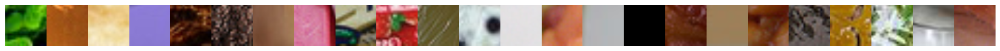

In [36]:
m_samp = np.round(linspace(1, test_ims.shape[3]-4, 24))

f = figure(figsize=(24,2))
  
for ix,imx in enumerate(m_samp):   
    ax = subplot(1, len(m_samp), ix+1+0*len(m_samp))
    
    imshow(257-test_ims[:,:,:,imx])
    ax.set_xticks([])
    ax.set_yticks([]) 
    ax.set_frame_on(False)

    
savefig('figures/image_orig-nN=' + str(len(test_N)) + '-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/image_orig-nN=' + str(len(test_N)) + '-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


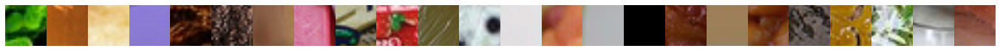

In [37]:
ic_code = ic_code_all[0]
pix_code = pix_code_all[0] #/ test_N[0]
#m_samp = np.round(linspace(2, test_ims.shape[3]-93, 24))

f = figure(figsize=(24,2))
  
for ix,imx in enumerate(m_samp):   
    ax = subplot(1, len(m_samp), ix+1+0*len(m_samp))

    recon = pix_code[imx,:]
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    reconr += mean01
    reconr[reconr<0]=0
    reconr[reconr>1] = 1
    
    imshow(reconr)
    ax.set_xticks([])
    ax.set_yticks([]) 
    ax.set_frame_on(False)

    
savefig('figures/image_icc-nN=' + str(len(test_N)) + '-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/image_icc-nN=' + str(len(test_N)) + '-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

In [62]:
pix_code.min(), pix_code.max()

(-0.44949518499999991, 1.0)

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image_recon-nN=6mr-1-496-n161213


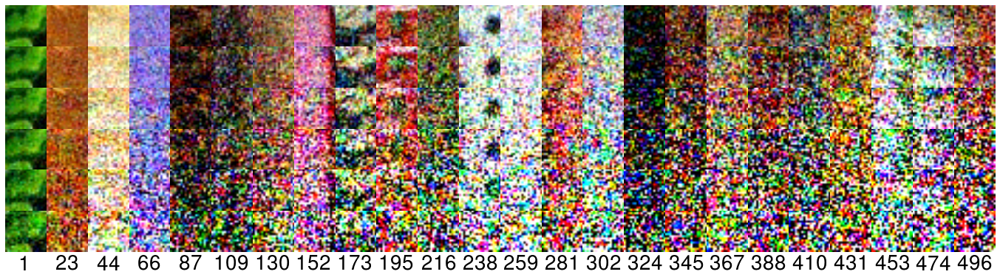

In [60]:
K=1

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = ic_decode_all[len(test_N) - iN - 1]
        recon = np.dot(ic_decode[imx+K,:], ic_comp) / test_N[len(test_N) - iN - 1]
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        reconr += mean01
        reconr[reconr<0]=0
        reconr[reconr>1] = 1
        
        imshow(reconr)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)), fontsize=28)
    
fname = ('figures/image_recon-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname
savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)

In [260]:
reconr.max()/test_N[iN]

3.1250000000000001e-06

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image_recon-pix-nN=6mr-1-496-n161213


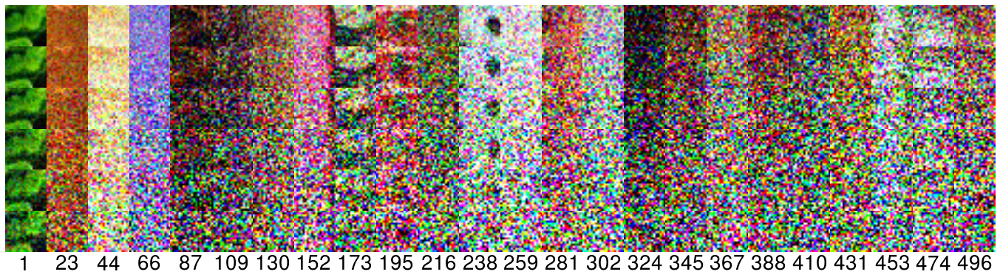

In [97]:
K=1

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        pix_decode = pix_decode_all[len(test_N) - iN - 1]
        recon = pix_decode[imx+K, :] / test_N[len(test_N) - iN - 1] #np.dot(ic_decode[imx+K,:], ic_comp)  / test_N[len(test_N) - iN - 1]
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        reconr += mean01
        reconr[reconr<0]=0
        reconr[reconr>1] = 1
        
        imshow(reconr)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)), fontsize=28)
    
    
fname = ('figures/image_recon-pix-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname
savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)


In [95]:

spcoder = SparseCoder(ic_comp, 'lasso_cd', transform_alpha=2)


/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image_recon-pix_sp-nN=6mr-1-496-n161213


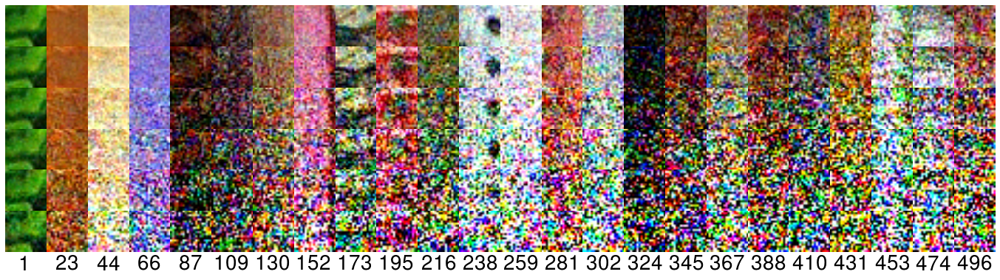

In [98]:
K=1

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        pix_decode = pix_decode_all[len(test_N) - iN - 1]
        pixr = pix_decode[imx+K, :] / test_N[len(test_N) - iN - 1] #np.dot(ic_decode[imx+K,:], ic_comp)  / test_N[len(test_N) - iN - 1]
        
        coefs = spcoder.transform(pixr)
        
        recon = np.dot(coefs, ic_comp)
        
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        reconr += mean01
        reconr[reconr<0]=0
        reconr[reconr>1] = 1
        
        imshow(reconr)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)), fontsize=28)
    
    
fname = ('figures/image_recon-pix_sp-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname
savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)


In [67]:

for i in range(len(test_N)):
    pd = pix_decode_all[i] 
    print pd.max(), test_N[i]

102134.993361 10000.0
139213.301286 20000.0
202557.933507 40000.0
292743.273333 80000.0
459813.467331 160000.0
634292.832179 320000.0


In [61]:
reconr.min(), reconr.max()

(0.0, 1.0)

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image_recon-sp2-nN=6mr-1-496-n161212


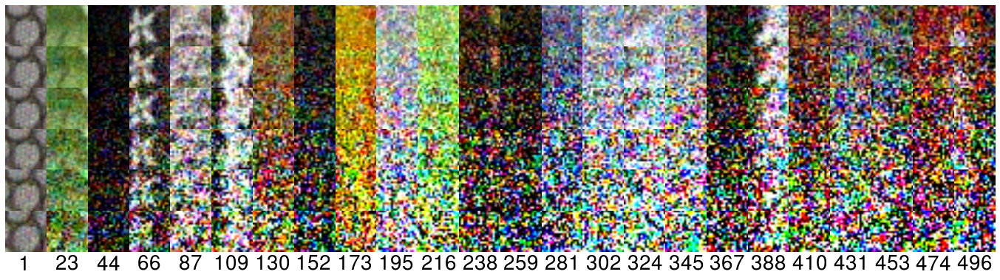

In [317]:
K=1

#m_samp = arange(24)

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = sp2_decode_all[len(test_N) - iN - 1]
        recon = np.dot(ic_decode[imx+K,:], ic_comp)
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        reconr += mean01
        reconr[reconr<0]=0
        reconr[reconr>1] = 1
        
        imshow(reconr)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)), fontsize=28)
    
    
fname = ('figures/image_recon-sp2-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname

savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)


In [263]:
reconr.min()

0.0

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image1_recon-nN=6mr-1-496-n161213


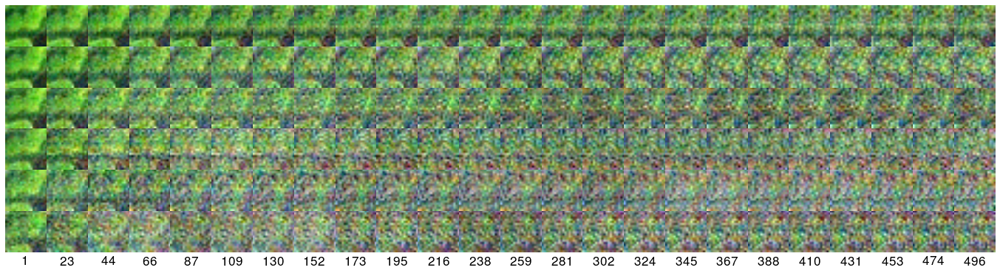

In [92]:

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = ic_decode1_all[len(test_N) - iN - 1]
        recon = np.dot(ic_decode[imx+K,:], ic_comp)
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        imshow(norm_range(reconr))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)))
    

    
fname = ('figures/image1_recon-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname

savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)


/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image1_recon-sp-nN=6mr-1-496-n161213


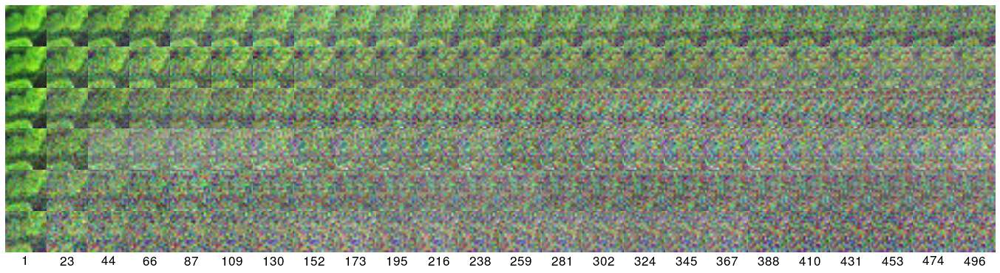

In [93]:

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = pix_decode1_all[len(test_N) - iN - 1]
        recon = ic_decode[imx+K] / test_N[len(test_N) - iN - 1]
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        imshow(norm_range(reconr))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)))
    

fname = ('figures/image1_recon-sp-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname

savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)


/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


figures/image1_recon-sp2-nN=6mr-0-495-n161210


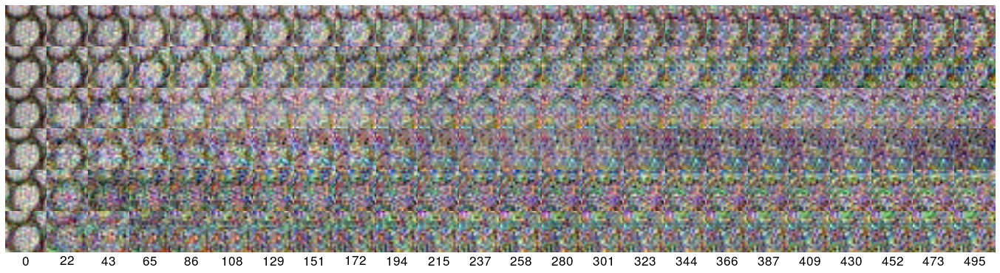

In [244]:

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = sp2_decode1_all[len(test_N) - iN - 1]
        recon = np.dot(ic_decode[imx+K,:], ic_comp)
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        imshow(norm_range(reconr))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)))
    

fname = ('figures/image1_recon-sp2-nN=' + str(len(test_N))
         + 'mr-' + str(int(m_samp.min())) + '-' + str(int(m_samp.max()))
         + '-n' + time.strftime('%y%m%d'))
print fname

savefig(fname + '.png', format='png', transparent=True)
savefig(fname + '.eps', format='eps', transparent=True)


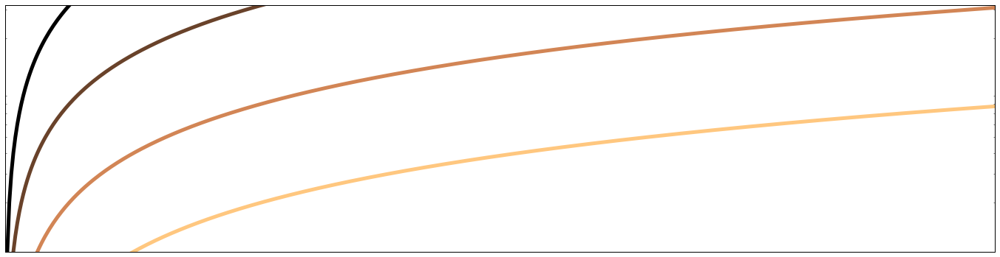

In [99]:
figure(figsize=(24,6))

iso_error = [0.2, 0.4, 0.8, 1.6]
M = arange(m_samp.min(), m_samp.max())
D = ic_code.shape[1]  
cm = get_cmap('copper', len(iso_error))
for ix,error in enumerate(iso_error):
    N = D*(M-1)/error**2
    plot(M, N, lw=5, color=cm(ix))
    
yscale('log')
ylim([test_N[0], test_N[-1]])
xlim([M[0], M[-1]])
xticks([])
yticks([])

savefig('figures/iso_error_curves-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/iso_error_curves-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

In [113]:
ic_norms = np.zeros(ic_code.shape[0])
pix_norms = np.zeros(pix_code.shape[0])

for imx in range(ic_code.shape[0]):
    ic_norms[imx] = norm(ic_code[imx, :])
    pix_norms[imx] = norm(pix_code[imx, :] - pix_code[imx, :].mean())

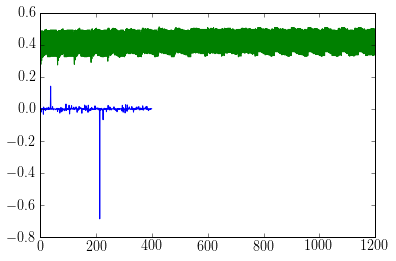

In [112]:
plot(ic_code[2, :])
plot(pix_code[2,:])

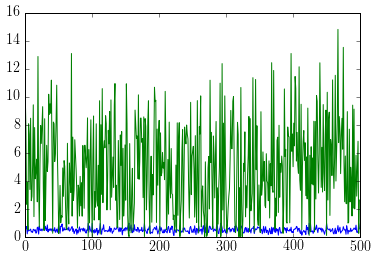

In [114]:
plot(ic_norms)
plot(pix_norms)

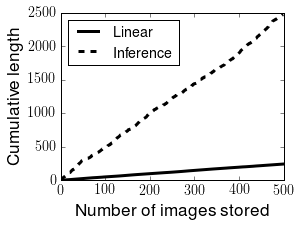

In [115]:
figure(figsize=(4,3))


ic_cumlen = cumsum(ic_norms)
pix_cumlen = cumsum(pix_norms)

plot(ic_cumlen, 'k', lw=3, label='Linear')
plot(pix_cumlen, '--k', lw=3, label='Inference')

legend(loc='upper left')
xlabel('Number of images stored')
ylabel('Cumulative length')


savefig('figures/cumulative_length-ic_pix-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/cumulative_length-ic_pix-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

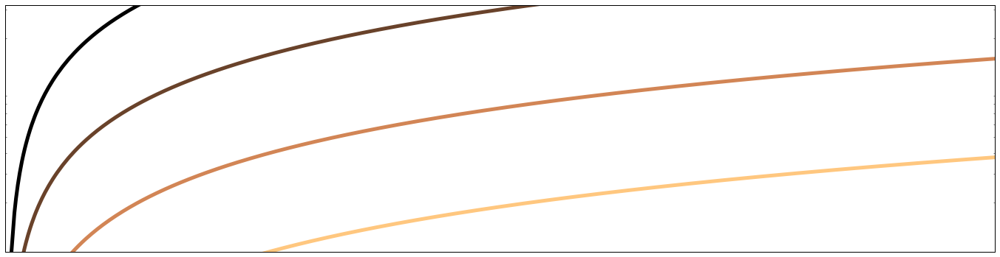

In [103]:
figure(figsize=(24,6))

iso_error = [0.2, 0.4, 0.8, 1.6]
M = ic_cumlen #arange(m_samp.min(), m_samp.max())
D = ic_code.shape[1]  
cm = get_cmap('copper', len(iso_error))
for ix,error in enumerate(iso_error):
    N = D*(M-1)/error**2
    plot(M, N, lw=5, color=cm(ix))
    
yscale('log')
ylim([test_N[0], test_N[-1]])
xlim([M[0], M[-1]])
xticks([])
yticks([])

savefig('figures/iso_error_curves-cuml-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/iso_error_curves-cuml-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

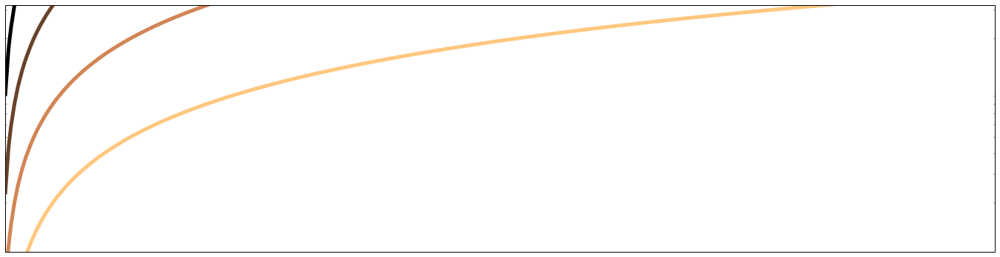

In [116]:
figure(figsize=(24,6))

iso_error = [0.2, 0.4, 0.8, 1.6]
M = pix_cumlen #arange(m_samp.min(), m_samp.max())
D = ic_code.shape[1]  
cm = get_cmap('copper', len(iso_error))
for ix,error in enumerate(iso_error):
    N = D*(M-1)/error**2
    plot(M, N, lw=5, color=cm(ix))
    
yscale('log')
ylim([test_N[0], test_N[-1]])
xlim([M[0], M[-1]])
xticks([])
yticks([])

savefig('figures/iso_error_curves-pix_cuml-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/iso_error_curves-pix_cuml-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

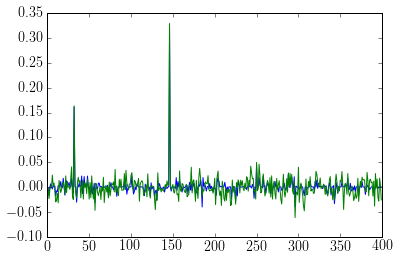

In [302]:
ic_decode = sp_decode_all[0]
idx = 10
plot(sp_code[0+idx,:])
plot(ic_decode[K+idx, :]/test_N[0])

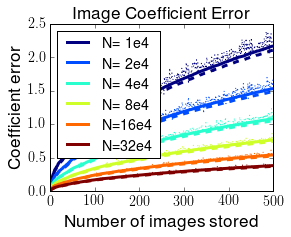

In [310]:
figure(figsize=(4,3))
ic_ncode = ic_code #/ norm(ic_code, axis=1)[:, np.newaxis]

cm=get_cmap('jet', len(test_N))
M = np.arange(ic_code.shape[0])

for iN in range(len(test_N)):
    ic_decode = ic_decode_all[iN]
    ic_error = np.sum((ic_ncode[0:(-K),:]-ic_decode[K:,:]/test_N[iN])**2, axis=1)**0.5

    plot(M[K:], ic_error.T, ':', color=cm(iN))
    plot(M[K:], np.sqrt(ic_decode.shape[1] * ic_cumlen[K:]/ test_N[iN]/2), lw=3, color=cm(iN), label='N=%2de4' % (test_N[iN]/1e4))

    plot(M[K:], np.sqrt(ic_decode.shape[1] * sp_cumlen[K:]/ test_N[iN]/2), '--', lw=3, color=cm(iN))

xlabel('Number of images stored')
ylabel('Coefficient error')
title('Image Coefficient Error')
legend(loc='upper left')

savefig('figures/coefficient_error_fit-ic-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/coefficient_error_fit-ic-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

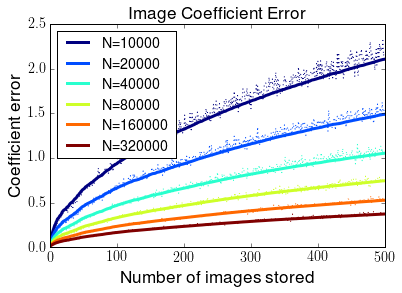

In [307]:

ic_ncode = sp_code #/ norm(ic_code, axis=1)[:, np.newaxis]

cm=get_cmap('jet', len(test_N))
M = np.arange(ic_code.shape[0])

for iN in range(len(test_N)):
    ic_decode = sp2_decode_all[iN]
    ic_error = np.sum((ic_ncode[0:(-K),:]-ic_decode[K:,:])**2, axis=1)**0.5

    plot(M[K:], ic_error.T, ':', color=cm(iN))
    plot(M[K:], np.sqrt(ic_decode.shape[1] * sp_cumlen[K:]/ test_N[iN]/2), lw=3, color=cm(iN), label='N=%05d' % test_N[iN])
    
xlabel('Number of images stored')
ylabel('Coefficient error')
title('Image Coefficient Error')
legend(loc='upper left')

savefig('figures/coefficient_error_fit-sp2-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/coefficient_error_fit-sp2-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

In [175]:
ic_cumlen.shape

(1100,)

In [176]:
ic_error.shape


(1099,)